In [1]:
#Zebrafish_farrel2018
import pandas as pd
import numpy as np
from scipy.sparse import csr_matrix
import scanpy.api as sc
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from scipy.stats import binom

from quasildr.graphdr import graphdr

data=pd.read_csv('./data/other/farrell_2018.data.gz', sep='\t')
data = data.set_index('GENE')

dataanno=pd.read_csv('./data/other/farrell_2018.anno', sep='\t')
dataanno = dataanno.iloc[1:,:]

data = data.iloc[:,dataanno['Segment'].map(str).replace('\.0','').values!='38']
dataanno = dataanno.iloc[dataanno['Segment'].map(str).replace('\.0','').values!='38',:]


adata = sc.AnnData(2 ** data.values.T -1, dataanno, data.index.values)
sc.pp.recipe_zheng17(adata,n_top_genes=1000)
sc.tl.pca(adata)

def ksmooth(x, k, rescale_k=False):
    if rescale_k and k > 1. / 0.632:
        k = k * 0.632
    return np.maximum(1-binom.cdf(np.maximum(x-k-1,0), x-1, .632), x<=k)



l=100000
m = 'cosine'
k = 12

nn_stage={}
stages = np.unique(adata.obs['Stage'])
for s in stages:
    nn_stage[s]=NearestNeighbors(k,metric=m).fit(adata.obsm['X_pca'][adata.obs['Stage'].values==s,:])


s=[]
t=[]
w=[]
for i in range(len(stages)-1):
    dis, ind = nn_stage[stages[i]].kneighbors(adata.obsm['X_pca'][adata.obs['Stage'].values==stages[i+1],:], k)
    s.append(np.repeat(np.argwhere(adata.obs['Stage'].values==stages[i+1]), ind.shape[1]))
    t.append(np.argwhere(adata.obs['Stage'].values==stages[i])[ind].flatten())
    w.append(np.ones(k*np.sum(adata.obs['Stage'].values==stages[i+1])))
    #w.append(1*ksmooth(np.tile(np.arange(1,k+1),np.sum(adata.obs['Stage'].values==stages[i+1])),k=1,rescale_k=False))

for i in range(1, len(stages)):
    dis, ind = nn_stage[stages[i]].kneighbors(adata.obsm['X_pca'][adata.obs['Stage'].values==stages[i-1],:], k)
    s.append(np.repeat(np.argwhere(adata.obs['Stage'].values==stages[i-1]), ind.shape[1]))
    t.append(np.argwhere(adata.obs['Stage'].values==stages[i])[ind].flatten())
    w.append(np.ones(k*np.sum(adata.obs['Stage'].values==stages[i-1])))
    #w.append(1*ksmooth(np.tile(np.arange(1,k+1),np.sum(adata.obs['Stage'].values==stages[i-1])),k=1,rescale_k=False))

for i in range(len(stages)):
    dis, ind = nn_stage[stages[i]].kneighbors(adata.obsm['X_pca'][adata.obs['Stage'].values==stages[i],:], k+1)
    dis = dis[:,1:]
    ind = ind[:,1:]
    s.append(np.repeat(np.argwhere(adata.obs['Stage'].values==stages[i]), ind.shape[1]))
    t.append(np.argwhere(adata.obs['Stage'].values==stages[i])[ind].flatten())
    w.append(np.ones(k*np.sum(adata.obs['Stage'].values==stages[i])))
    #w.append(1*ksmooth(np.tile(np.arange(1,k+1),np.sum(adata.obs['Stage'].values==stages[i])),k=1,rescale_k=False))

g = csr_matrix((np.concatenate(w),(np.concatenate(s).astype(np.int),np.concatenate(t).astype(np.int))),(adata.obsm['X_pca'].shape[0],adata.obsm['X_pca'].shape[0]))


/mnt/home/jzhou/anaconda2/envs/drgraph/lib/python3.7/site-packages/anndata/core/anndata.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/mnt/home/jzhou/anaconda2/envs/drgraph/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
Transforming to str index.


In [2]:
adata.obsm['X_d']=graphdr(adata.obsm['X_pca'] , refine_iter=0, refine_threshold=9, custom_graph = g, _lambda=100000, no_rotation=True)

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode()

traces = [go.Scatter3d(
    x = np.asarray(adata.obsm['X_d'][adata.obs['Stage']==c,0]).flatten(),
    y = np.asarray(adata.obsm['X_d'][adata.obs['Stage']==c,1]).flatten(),
    z = np.asarray(adata.obsm['X_d'][adata.obs['Stage']==c,2]).flatten(),
    marker=dict(
        size=0.3,
    ),
    mode='markers',
    name=c
) for c in np.unique(adata.obs['Stage'].map(str)) if c!='nan']
iplot(traces)

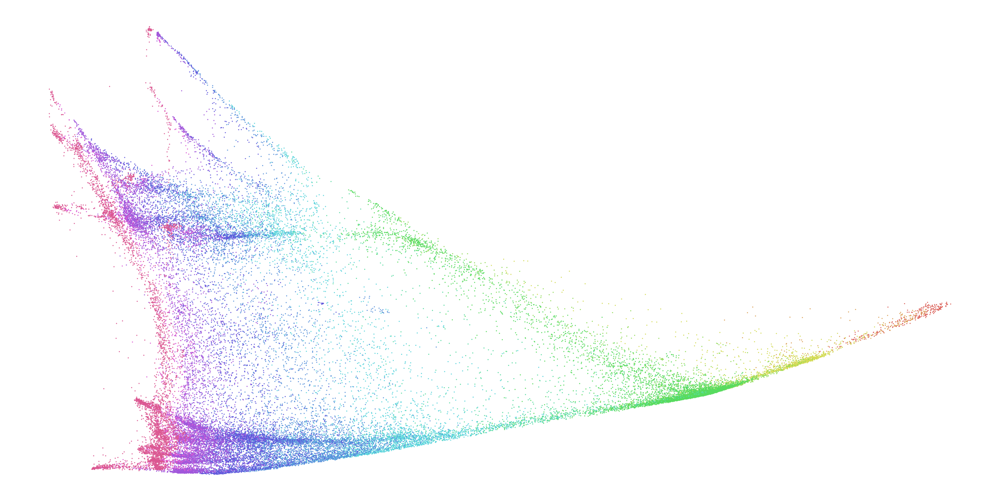

<ggplot: (2932453232823)>

In [3]:
from plotnine import *
import plotnine
plotnine.options.figure_size=(30,15)
p = ggplot(pd.DataFrame({'x':adata.obsm['X_d'][:,0], 'y':adata.obsm['X_d'][:,1], 'c': adata.obs['Stage']}))+geom_point(aes(x='x', y='y', color='c'),size=0.01)+ guides(color=False)+  theme_void()
p

In [4]:
pd.DataFrame(adata.obsm['X_d'],index=adata.obs.iloc[:,0], columns=['D'+str(i) for i in range(adata.obsm['X_d'].shape[1])]).to_csv(
 './figures/zebrafish_farrell2018.graphdr.txt',index_label=False,sep='\t')
